In [1]:
import numpy as np # for matrix operations and fast math functions
import scipy.signal as signal # for signal processing functions
import matplotlib.pyplot as plt # for plotting things
import soundfile as sf # for loading and writing audio files
import os as os # for operating system path manipulation
import IPython.display as ipd # displaying audio in the python notebook
import scipy.signal as sig
from IPython.display import clear_output
%matplotlib inline
import seaborn as sns

## Load audio files

In [3]:
filePath = 'Audio/'

pickup_8 = 'Pickup_8.wav'
pickup_10 = 'Pickup_10.wav'
pickup_11 = 'Pickup_Test_mono.wav'
pickup_12 = 'Pickup_Train_mono.wav'

mic_8 = 'Mic_8.wav'
mic_10 = 'Mic_10.wav'
mic_11 = 'Mic_Test_mono.wav'
mic_12 = 'Mic_Train_mono.wav'

pickup_test, fs = sf.read(os.path.join(filePath,pickup_8))
pickup_train, fs = sf.read(os.path.join(filePath,pickup_10))
pickup_test2, fs = sf.read(os.path.join(filePath,pickup_11))
pickup_train2, fs = sf.read(os.path.join(filePath,pickup_12))

mic_test, fs = sf.read(os.path.join(filePath,mic_8))
mic_train, fs = sf.read(os.path.join(filePath,mic_10))
mic_test2, fs = sf.read(os.path.join(filePath,mic_11))
mic_train2, fs = sf.read(os.path.join(filePath,mic_12))


## Define functions to make pickup filter

In [5]:
# Minphase function taken from HW4 

def minphaseFromMagSpectrum(H_mag):
# Returns a minimum Phase ir from an a magnitude spectrum transfer function of an ir
 
    ## return minimum phase signal
    temp = np.log(np.abs(H_mag))
    ir_temp = np.imag(sig.hilbert(temp))
    ir_min = np.fft.ifft(np.exp(temp-1j*ir_temp))
    return ir_min

In [6]:
# Make filter to transform pickup to microphone-like signal

def makeFilter(mic, pickup, smooth):
    
    #Take STFTs
    f,t,mic_stft = sig.stft(mic,fs,nperseg=8192*2)
    f,t,pickup_stft = sig.stft(pickup,fs,nperseg=8192*2)
    
    #Average across time
    mic_avg = np.mean(np.abs(mic_stft), axis=1)
    pickup_avg = np.mean(np.abs(pickup_stft), axis=1)
    
    #Smooth frequency response
    mic_smooth = sig.savgol_filter(mic_avg,smooth,3)
    pickup_smooth = sig.savgol_filter(pickup_avg, smooth,3)
    
    #Divide mic FR by pickup FR
    H = mic_smooth/pickup_smooth
    
    #Make minimum phase
    H_min = minphaseFromMagSpectrum(H)
    
    return H_min

## STFTs

(8193, 2348)
(8193, 2348)


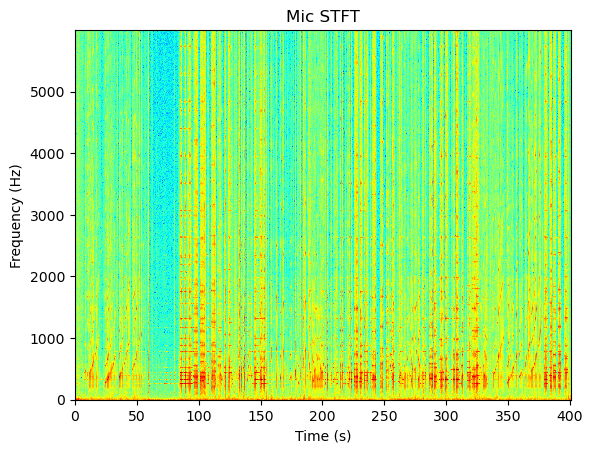

In [8]:

f,t,mic_stft = sig.stft(mic_train2,fs,nperseg=8192*2)
f,t,pickup_stft = sig.stft(pickup_train2,fs,nperseg=8192*2)

print(np.shape(mic_stft))
print(np.shape(pickup_stft))

fig, ax0 = plt.subplots(1, 1)

c = ax0.pcolormesh(t, f[0:2048], 20*np.log10(np.abs(mic_stft))[0:2048,:], cmap = 'jet')
ax0.set_title('Mic STFT')
ax0.set_xlabel('Time (s)')
ax0.set_ylabel('Frequency (Hz)')
plt.show()

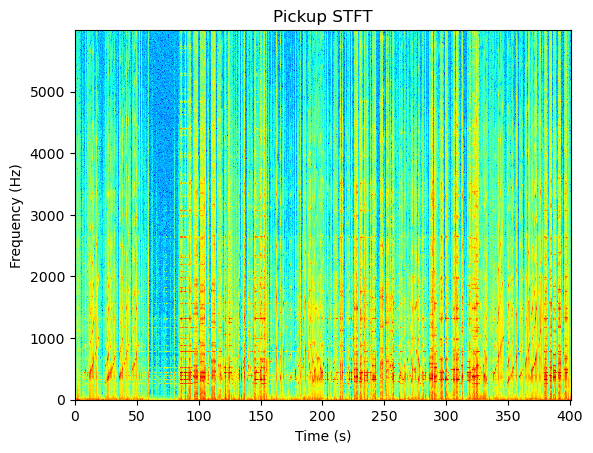

In [9]:
fig, ax0 = plt.subplots(1, 1)

c = ax0.pcolormesh(t, f[0:2048], 20*np.log10(np.abs(pickup_stft))[0:2048,:], cmap = 'jet')
ax0.set_title('Pickup STFT')
ax0.set_xlabel('Time (s)')
ax0.set_ylabel('Frequency (Hz)')
plt.show()

## Averaged and Smoothed FRs

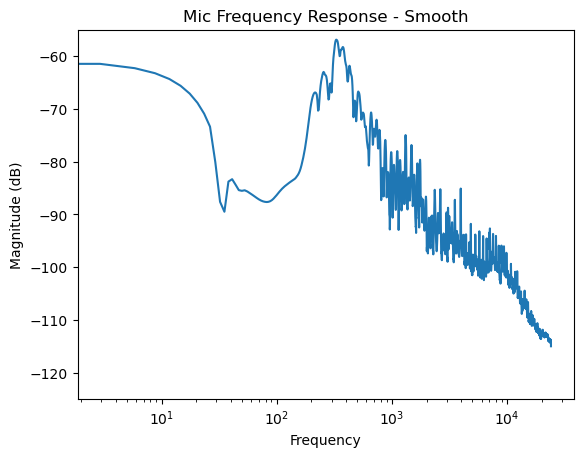

In [11]:
mic_avg = np.mean(np.abs(mic_stft), axis=1)
mic_smooth = sig.savgol_filter(mic_avg, 20,3)
np.shape(mic_avg)
plt.semilogx(f,20*np.log10(mic_smooth))
plt.title("Mic Frequency Response - Smooth")
plt.ylim([-125, -55])
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()

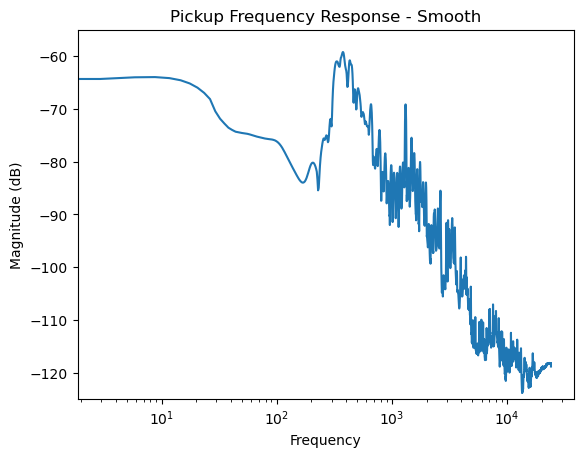

In [12]:
pickup_avg = np.mean(np.abs(pickup_stft), axis=1)
pickup_smooth = sig.savgol_filter(pickup_avg, 20,3)
np.shape(pickup_avg)
plt.semilogx(f,20*np.log10(pickup_smooth))
# plt.plot(f,20*np.log10(pickup_smooth))
plt.title("Pickup Frequency Response - Smooth")
plt.ylim([-125, -55])
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()

## Dividing mic by pickup

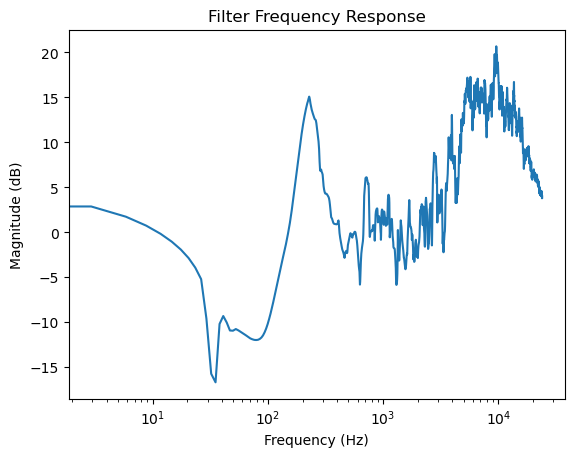

In [14]:
H = mic_smooth/pickup_smooth
plt.semilogx(f,20*np.log10(mic_smooth/pickup_smooth))
plt.title("Filter Frequency Response")
plt.ylabel("Magnitude (dB)")
plt.xlabel("Frequency (Hz)")
plt.show()

## Calling makeFilter function and plotting IR

/opt/anaconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/opt/anaconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


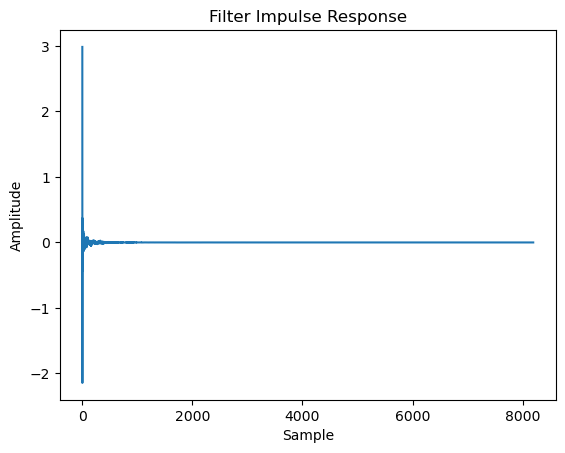

In [16]:
H_min = makeFilter(mic_train2,pickup_train2,20)
plt.plot(H_min)
plt.title("Filter Impulse Response")
plt.xlabel("Sample")
plt.ylabel("Amplitude")
plt.show()

## Cutoff tail of IR

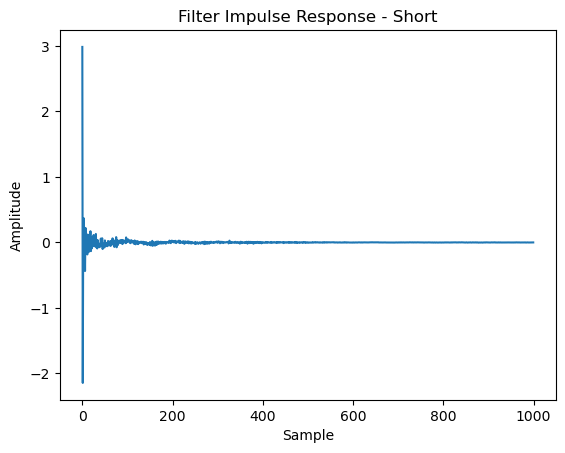

In [18]:
h_min_cutoff = H_min[0:1000]
plt.plot(h_min_cutoff)
plt.title("Filter Impulse Response - Short")
plt.xlabel("Sample")
plt.ylabel("Amplitude")
plt.show()

## Take FFT of IR

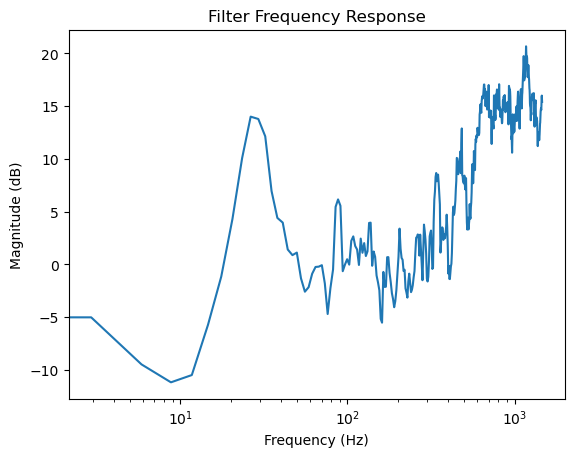

In [20]:
fft=np.fft.fft(h_min_cutoff)
plt.semilogx(f[0:len(fft)//2],20*np.log10(fft[0:len(fft)//2]))
plt.title("Filter Frequency Response")
plt.ylabel("Magnitude (dB)")
plt.xlabel("Frequency (Hz)")
plt.show()

## IIR Filters

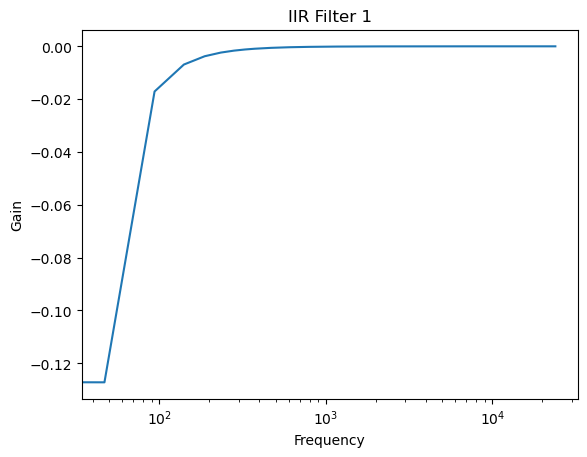

In [22]:
# [bz, az] = sig.iirnotch(0.0002, 0.25)
bz, az = sig.iirnotch(27, 5, 48000)
wz, H = sig.freqz(b=bz, a=az,fs=fs);
# plt.semilogx(wz*fs/(2*np.pi), 20*np.log10(np.abs(H)), 'r-', linewidth = 2, label = "Model, no pre-warping")
plt.semilogx(wz, 20*np.log10(np.abs(H)))
# plt.ylim([-40,10])
# plt.xlim([0,24000])
plt.title("IIR Filter 1")
plt.ylabel("Gain")
plt.xlabel("Frequency")
plt.show()

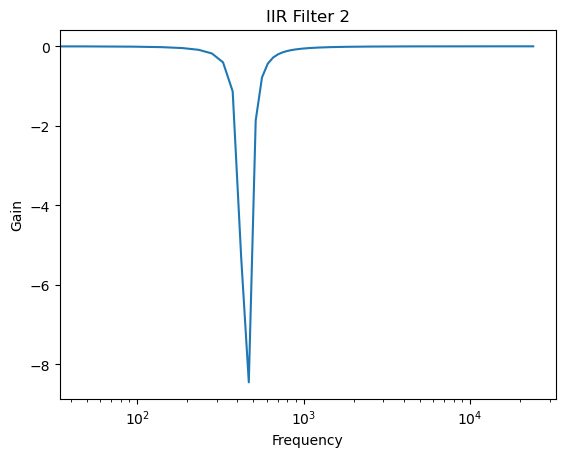

In [23]:
# [bz, az] = sig.iirnotch(0.0002, 0.25)
bz, az = sig.iirnotch(450,5, fs = 48000)
wz, H = sig.freqz(b=bz, a=az,fs=fs);
# plt.semilogx(wz*fs/(2*np.pi), 20*np.log10(np.abs(H)), 'r-', linewidth = 2, label = "Model, no pre-warping")
plt.semilogx(wz, 20*np.log10(np.abs(H)))
# plt.ylim([-40,10])
# plt.xlim([0,24000])
plt.title("IIR Filter 2")
plt.ylabel("Gain")
plt.xlabel("Frequency")
plt.show()

## Test Signals

### Short test

In [26]:
# Microphone Signal
ipd.Audio(mic_test, rate=fs) 

In [27]:
#Pickup Signal
ipd.Audio(pickup_test, rate=fs) 

In [28]:
#Filtered Signal (no IIRs)
signal_filtered_2 = np.convolve(pickup_test,h_min_cutoff)
ipd.Audio(signal_filtered_2, rate=fs) 

/opt/anaconda3/lib/python3.12/site-packages/IPython/lib/display.py:172: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


In [29]:
#Filtered Signal (with IIRs)
ipd.Audio(signal_filtered_2, rate=fs) 
bz, az = sig.iirnotch(27, 5, 48000)
signal_filtered3 = sig.lfilter(bz,az,signal_filtered_2)
bz, az = sig.iirnotch(450,5, fs = 48000)
signal_filtered3 = sig.lfilter(bz,az,signal_filtered3)
bz, az = sig.iirnotch(0.05, 0.1)
ipd.Audio(signal_filtered3, rate=fs) 

### Long test

In [31]:
# Microphone Signal
ipd.Audio(mic_test2, rate=fs) 

In [32]:
# Pickup Signal
ipd.Audio(pickup_test2, rate=fs) 

In [33]:
# Filtered Signal (no IIRs)
signal_filtered = np.convolve(pickup_test2,h_min_cutoff)
ipd.Audio(signal_filtered, rate=fs) 

In [34]:
#Filtered Signal (with IIRs)
bz, az = sig.iirnotch(27, 5, 48000)
signal_filtered2 = sig.lfilter(bz,az,signal_filtered)
bz, az = sig.iirnotch(450,5, fs = 48000)
signal_filtered2 = sig.lfilter(bz,az,signal_filtered2)
ipd.Audio(signal_filtered2, rate=fs) 

## Test Signal FFTs

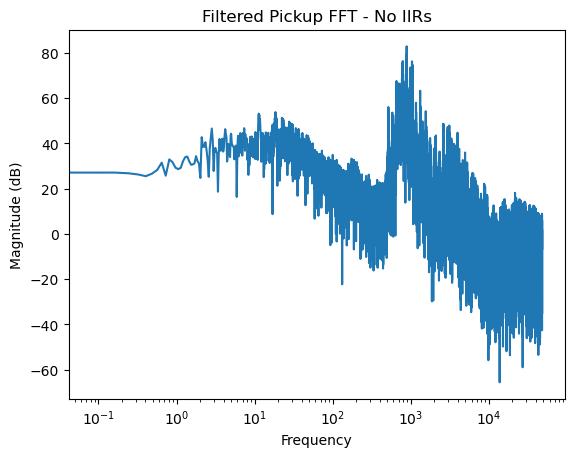

In [36]:
N = len(signal_filtered)//2
f = np.arange(N)*fs/N
fft = np.fft.fft(signal_filtered)
plt.semilogx(f,20*np.log10(fft)[0:len(fft)//2])
plt.title("Filtered Pickup FFT - No IIRs")
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()

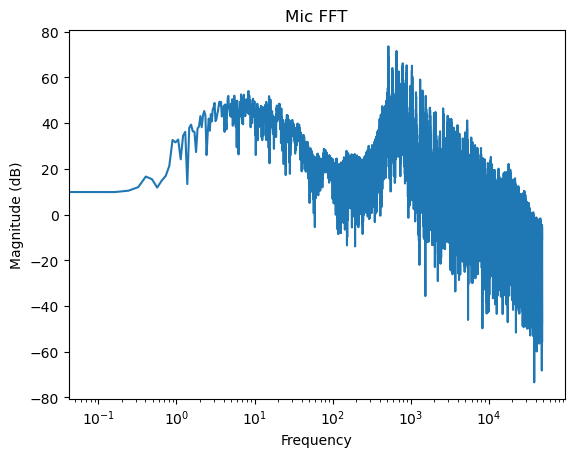

In [37]:
N = len(mic_test2)//2
f2 = np.arange(N)*fs/N
fft = np.fft.fft(mic_test2)
plt.semilogx(f2,20*np.log10(fft)[0:len(fft)//2])
plt.title("Mic FFT")
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()

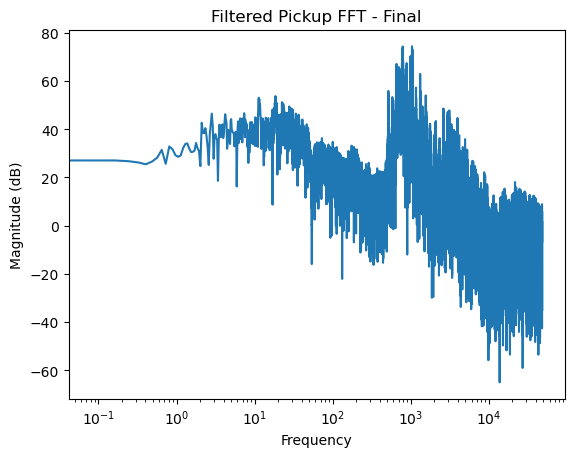

In [38]:
fft = np.fft.fft(signal_filtered2)
plt.semilogx(f,20*np.log10(fft)[0:len(fft)//2])
plt.title("Filtered Pickup FFT - Final")
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()

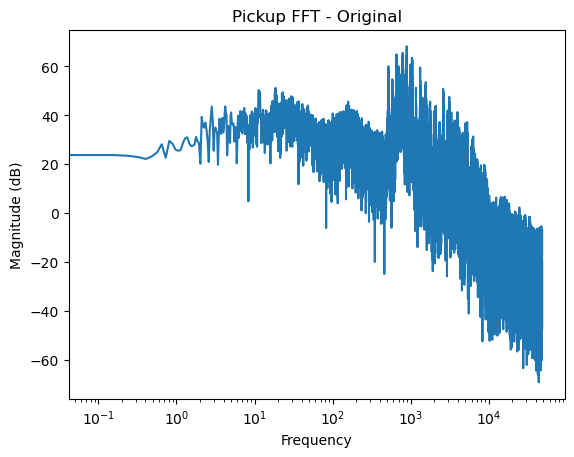

In [39]:
fft = np.fft.fft(pickup_test2)
plt.semilogx(f2,20*np.log10(fft)[0:len(fft)//2])
plt.title("Pickup FFT - Original")
plt.xlabel("Frequency")
plt.ylabel("Magnitude (dB)")
plt.show()